## Import Pandas

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
train_data = pd.read_json("datasets/Training_data.json", lines=True)
valid_data = pd.read_json("datasets/Test_data.json",lines=True)

## Inspect dataset

In [3]:
train_data.head()

,text,parent_comment,article_title,article_url,platform,platform_id,composite_toxic
0,"WTF, y'all never made MRE fart balloons in the...",None,Triangular UFO hovers over California military...,https://www.dailymail.co.uk/news/article-12112...,reddit,jlcm021,"[[False, 74], [True, 323], [False, 1028], [Fal..."
1,No apologies !! McCall has balls ! Ccp is not...,None,China sentences elderly US citizen to life in ...,https://www.cnn.com/2023/05/15/china/china-jai...,youtube,Ugws8gNW7eJyE9VHeM14AaABAg,"[[False, 216], [False, 197], [False, 1039], [F..."
2,What ever you need to tell yourself to sleep a...,I wonder how many undercover agents will be go...,Jan. 6 defendant who put foot on desk in Pelos...,https://www.cbsnews.com/news/richard-barnett-j...,youtube,UgxHlqwNcVssLHUr4yF4AaABAg.9q7kOunSlu-9q7lHH4he6S,"[[True, 192], [True, 193], [True, 260], [True,..."
3,@exZACKly @CBSNews Fuck off Nazi,@NCmylo @CBSNews Lol. Stop choosing to be an ...,19-year-old Missouri man arrested in U-Haul cr...,https://www.cbsnews.com/news/u-haul-crash-lafa...,twitter,1661025155047637000,"[[True, 92], [False, 218], [True, 69], [True, ..."
4,Texas is a republican sponsored killing ground...,None,At Least 8 Killed After Driver Plows Car Into ...,https://www.nytimes.com/2023/05/07/us/car-pede...,youtube,UgwpAfn9RIV0cHfhp4R4AaABAg,"[[False, 56], [True, 207], [False, 218], [Fals..."


In [4]:
train_data.columns

Index(['text', 'parent_comment', 'article_title', 'article_url', 'platform',
       'platform_id', 'composite_toxic'],
      dtype='object')

In [5]:
valid_data.head()

,text,parent_comment,article_title,article_url,platform,platform_id
0,Ukrainian Bullshit.,Russian Propaganda,Kremlin drone: Zelensky denies Ukraine attacke...,https://www.bbc.com/news/world-europe-65471904,youtube,UgxjV6HRpnD6FUmw8aV4AaABAg.9pH-CgX5yEH9pH7BMIfAz5
1,@LibDems No one likes you.\nYou denied democra...,None,"UK economy shrank 0.3% in March, ONS figures show",https://news.sky.com/story/uk-economy-shrank-0...,twitter,1657052099564150784
2,@EPurpera @BBCNews POS terrorist dictator Putr...,@BBCNews They should make peace talk.,Ukraine war: Kyiv hit by new massive Russian d...,https://www.bbc.com/news/world-65736730,twitter,1662672469205958656
3,@howardfineman @darkblue714 Bullshit. CNN set ...,None,Opinion | Why CNN's Trump town hall was always...,https://www.msnbc.com/opinion/msnbc-opinion/cn...,twitter,1656508255454019587
4,"The war will be won by who ""wins"" the race bet...",What is the pope gonna do? Pray and throw a co...,Zelenskyy to meet with Pope Francis at Vatican...,https://apnews.com/article/zelenskyy-italy-vis...,reddit,jk1pm1m


In [6]:
valid_data.columns

Index(['text', 'parent_comment', 'article_title', 'article_url', 'platform',
       'platform_id'],
      dtype='object')

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   text             4000 non-null   object
 1   parent_comment   1402 non-null   object
 2   article_title    4000 non-null   object
 3   article_url      4000 non-null   object
 4   platform         4000 non-null   object
 5   platform_id      4000 non-null   object
 6   composite_toxic  4000 non-null   object
dtypes: object(7)
memory usage: 218.9+ KB


In [8]:
valid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   text            500 non-null    object
 1   parent_comment  166 non-null    object
 2   article_title   500 non-null    object
 3   article_url     500 non-null    object
 4   platform        500 non-null    object
 5   platform_id     500 non-null    object
dtypes: object(6)
memory usage: 23.6+ KB


In [9]:
train_data["platform"].value_counts()

platform
reddit     1346
twitter    1331
youtube    1323
Name: count, dtype: int64

<Axes: xlabel='platform', ylabel='count'>

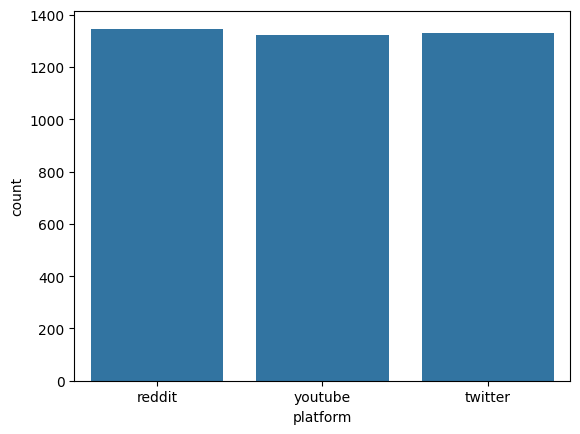

In [115]:
sns.countplot(data=train_data, x=train_data["platform"])
plt.show()

In [10]:
train_data["platform_id"].value_counts()

platform_id
jm23706                                              1
jmd0ny2                                              1
1653596023514644482                                  1
Ugyl8bTeNioviYzCmkx4AaABAg                           1
jmdftcw                                              1
                                                    ..
UgwpAfn9RIV0cHfhp4R4AaABAg                           1
1661025155047637000                                  1
UgxHlqwNcVssLHUr4yF4AaABAg.9q7kOunSlu-9q7lHH4he6S    1
Ugws8gNW7eJyE9VHeM14AaABAg                           1
jlcm021                                              1
Name: count, Length: 4000, dtype: int64

## Create a function for toxic count

In [11]:
def check_toxic(col):
    true_count = 0
    false_count = 0
    for i in range(len(col)):
        if col[i][0] is True:
            true_count += 1
        else:
            false_count += 1

    toxic= True if true_count > false_count else False
    return toxic

## Added column toxic to display composite toxic result

In [12]:
train_data["toxic"] = train_data["composite_toxic"].apply(check_toxic)

In [13]:
train_data['toxic'].value_counts()

toxic
False    2974
True     1026
Name: count, dtype: int64

In [14]:
train_data.head()

,text,parent_comment,article_title,article_url,platform,platform_id,composite_toxic,toxic
0,"WTF, y'all never made MRE fart balloons in the...",None,Triangular UFO hovers over California military...,https://www.dailymail.co.uk/news/article-12112...,reddit,jlcm021,"[[False, 74], [True, 323], [False, 1028], [Fal...",False
1,No apologies !! McCall has balls ! Ccp is not...,None,China sentences elderly US citizen to life in ...,https://www.cnn.com/2023/05/15/china/china-jai...,youtube,Ugws8gNW7eJyE9VHeM14AaABAg,"[[False, 216], [False, 197], [False, 1039], [F...",False
2,What ever you need to tell yourself to sleep a...,I wonder how many undercover agents will be go...,Jan. 6 defendant who put foot on desk in Pelos...,https://www.cbsnews.com/news/richard-barnett-j...,youtube,UgxHlqwNcVssLHUr4yF4AaABAg.9q7kOunSlu-9q7lHH4he6S,"[[True, 192], [True, 193], [True, 260], [True,...",True
3,@exZACKly @CBSNews Fuck off Nazi,@NCmylo @CBSNews Lol. Stop choosing to be an ...,19-year-old Missouri man arrested in U-Haul cr...,https://www.cbsnews.com/news/u-haul-crash-lafa...,twitter,1661025155047637000,"[[True, 92], [False, 218], [True, 69], [True, ...",True
4,Texas is a republican sponsored killing ground...,None,At Least 8 Killed After Driver Plows Car Into ...,https://www.nytimes.com/2023/05/07/us/car-pede...,youtube,UgwpAfn9RIV0cHfhp4R4AaABAg,"[[False, 56], [True, 207], [False, 218], [Fals...",False


In [15]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   text             4000 non-null   object
 1   parent_comment   1402 non-null   object
 2   article_title    4000 non-null   object
 3   article_url      4000 non-null   object
 4   platform         4000 non-null   object
 5   platform_id      4000 non-null   object
 6   composite_toxic  4000 non-null   object
 7   toxic            4000 non-null   bool  
dtypes: bool(1), object(7)
memory usage: 222.8+ KB


## When parent exact comment is not required

drop the parent_comment column and use the has_parent column

In [16]:
valid_data["has_parent_comment"] = valid_data["parent_comment"].notna()  # True/False
train_data["has_parent_comment"] = train_data["parent_comment"].notna()  # True/False

In [17]:
train_data.head()

,text,parent_comment,article_title,article_url,platform,platform_id,composite_toxic,toxic,has_parent_comment
0,"WTF, y'all never made MRE fart balloons in the...",None,Triangular UFO hovers over California military...,https://www.dailymail.co.uk/news/article-12112...,reddit,jlcm021,"[[False, 74], [True, 323], [False, 1028], [Fal...",False,False
1,No apologies !! McCall has balls ! Ccp is not...,None,China sentences elderly US citizen to life in ...,https://www.cnn.com/2023/05/15/china/china-jai...,youtube,Ugws8gNW7eJyE9VHeM14AaABAg,"[[False, 216], [False, 197], [False, 1039], [F...",False,False
2,What ever you need to tell yourself to sleep a...,I wonder how many undercover agents will be go...,Jan. 6 defendant who put foot on desk in Pelos...,https://www.cbsnews.com/news/richard-barnett-j...,youtube,UgxHlqwNcVssLHUr4yF4AaABAg.9q7kOunSlu-9q7lHH4he6S,"[[True, 192], [True, 193], [True, 260], [True,...",True,True
3,@exZACKly @CBSNews Fuck off Nazi,@NCmylo @CBSNews Lol. Stop choosing to be an ...,19-year-old Missouri man arrested in U-Haul cr...,https://www.cbsnews.com/news/u-haul-crash-lafa...,twitter,1661025155047637000,"[[True, 92], [False, 218], [True, 69], [True, ...",True,True
4,Texas is a republican sponsored killing ground...,None,At Least 8 Killed After Driver Plows Car Into ...,https://www.nytimes.com/2023/05/07/us/car-pede...,youtube,UgwpAfn9RIV0cHfhp4R4AaABAg,"[[False, 56], [True, 207], [False, 218], [Fals...",False,False


## Visualisation of toxic and non toxic comments

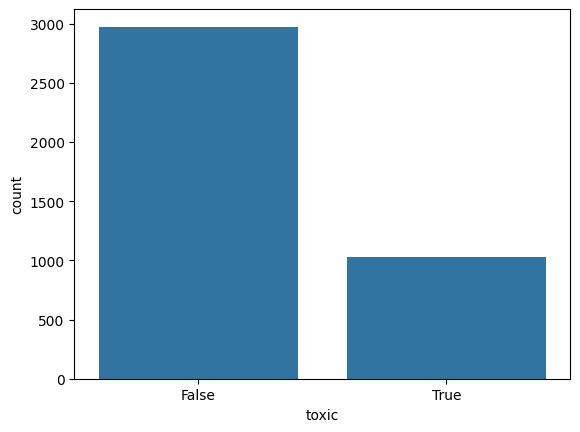

In [118]:
sns.countplot(data=train_data, x=train_data["toxic"])
plt.show()

<Axes: xlabel='has_parent_comment', ylabel='count'>

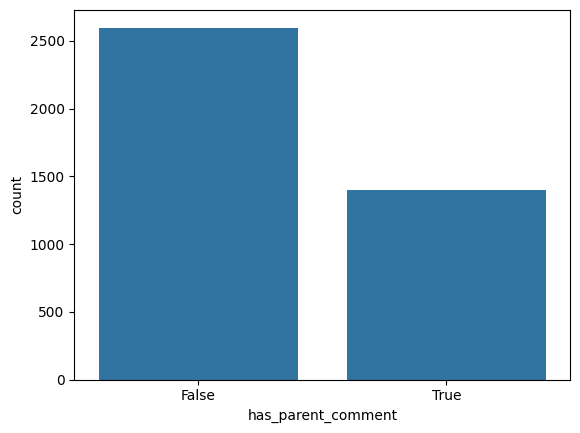

In [117]:
sns.countplot(data=train_data, x=train_data["has_parent_comment"])
plt.show()


In [74]:
x = train_data.drop(
    columns=['parent_comment', 'platform_id','composite_toxic', 'toxic',]
    )
y = train_data['toxic']

## When parent exact comment is required

use the parent_comment column as it is and make null entry an empty string

In [75]:
# valid_data["parent_comment"].fillna("", inplace=True)
# train_data["parent_comment"].fillna("", inplace=True)

In [76]:
# train_data.head()

In [77]:
# x = train_data.drop(
#     columns=["platform_id", "composite_toxic", "toxic"]
# )
# y = train_data["toxic"]

## Import liberies for models creation

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB, ComplementNB
from sklearn.metrics import classification_report, accuracy_score, ConfusionMatrixDisplay, confusion_matrix

## Split to test and train

In [79]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, 
stratify = y
)


## Preprocess the data

In [88]:
preprocessor = ColumnTransformer(
    transformers=[
        ("text", TfidfVectorizer(max_features=None,
        ngram_range=(1, 2),   # include bigrams e.g "not good" as one feature
        min_df=2,             # ignore very rare words
        max_df=0.95,          # ignore very common words
        sublinear_tf=True, 
        ), "text"),
        ("platform", OneHotEncoder(), ["platform"]),
        ("has_parent_comment", "passthrough", ["has_parent_comment"]),
    ]
)



In [106]:
def show_pipeline(model, model_name: str = "", test:bool=False):
    pipeline = Pipeline(steps=[("preprocessor", preprocessor), ("classifier", model)])

    if not test:
        pipeline.fit(X_train, y_train)
        y_pred = pipeline.predict(X_test)

        cm = confusion_matrix(y_test, y_pred)
        print(cm)
        display = ConfusionMatrixDisplay(confusion_matrix=cm)
        display.plot(cmap="Blues", colorbar=True)
        plt.title(f"{model_name}")

        print(accuracy_score(y_test, y_pred))
        print(classification_report(y_test, y_pred))
    return pipeline


## Logistic Regression

Logistic Regression


/home/righteousness/Documents/Codes/machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/righteousness/Documents/Codes/machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1429: UserWarning: Inconsistent values: penalty=l1 with l1_ratio=0.0. penalty is deprecated. Please use l1_ratio only.
  warnings.warn(


[[470 125]
 [ 80 125]]
0.74375
              precision    recall  f1-score   support

       False       0.85      0.79      0.82       595
        True       0.50      0.61      0.55       205

    accuracy                           0.74       800
   macro avg       0.68      0.70      0.69       800
weighted avg       0.76      0.74      0.75       800



,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('preprocessor', ...), ('classifier', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](5,)","['text','article_title','article_url','platform','has_parent_comment']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,5
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('text', ...), ('platform', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='

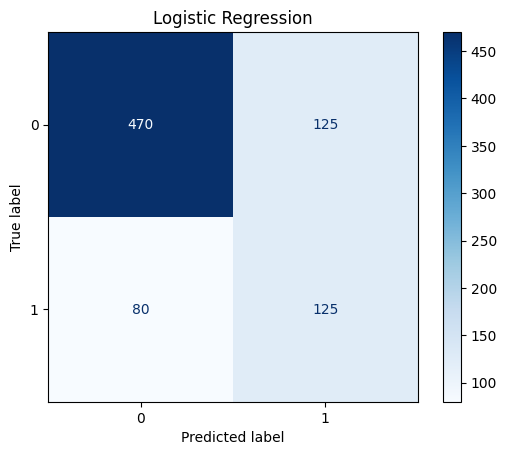

In [103]:
print("Logistic Regression")

lr = LogisticRegression(max_iter=1000,
                        solver="saga",
                        class_weight="balanced",
                        penalty='l1',
                        C=1
                        )
pipeline_lr= show_pipeline(lr,'Logistic Regression')
pipeline_lr

## Random Forest Tree Classifier

Random Forest
[[475 120]
 [ 70 135]]
0.7625
              precision    recall  f1-score   support

       False       0.87      0.80      0.83       595
        True       0.53      0.66      0.59       205

    accuracy                           0.76       800
   macro avg       0.70      0.73      0.71       800
weighted avg       0.78      0.76      0.77       800



,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('preprocessor', ...), ('classifier', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](5,)","['text','article_title','article_url','platform','has_parent_comment']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,5
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('text', ...), ('platform', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='

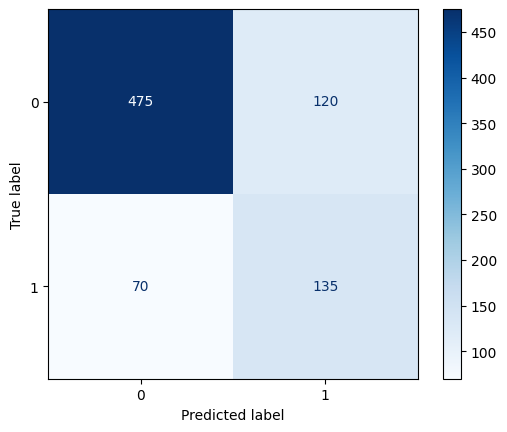

In [111]:
print("Random Forest")

rf = RandomForestClassifier(
    n_estimators=200, 
    class_weight='balanced',
    max_depth=10,
    max_features='sqrt',
    random_state=42
    )
show_pipeline(rf)

## Niave Bayes (MultinominalNB)

Naive Bayes
0.7725
              precision    recall  f1-score   support

       False       0.79      0.95      0.86       595
        True       0.65      0.25      0.36       205

    accuracy                           0.77       800
   macro avg       0.72      0.60      0.61       800
weighted avg       0.75      0.77      0.73       800



,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('preprocessor', ...), ('classifier', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](5,)","['text','article_title','article_url','platform','has_parent_comment']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,5
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('text', ...), ('platform', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='

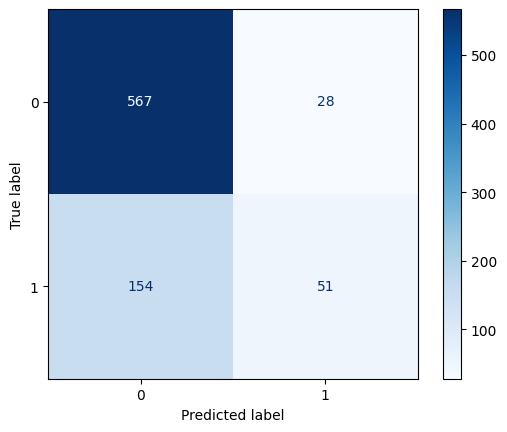

In [92]:
print("Naive Bayes")
nb = MultinomialNB(alpha=0.1)
show_pipeline(nb)

## Naive Bayes (ComplementsNB)

Naive Bayes
0.70375
              precision    recall  f1-score   support

       False       0.83      0.76      0.79       595
        True       0.44      0.54      0.48       205

    accuracy                           0.70       800
   macro avg       0.63      0.65      0.64       800
weighted avg       0.73      0.70      0.71       800



,"steps steps: list of tuplesList of (name of step, estimator) tuples that are to be chained insequential order. To be compatible with the scikit-learn API, all stepsmust define `fit`. All non-last steps must also define `transform`. See:ref:`Combining Estimators <combining_estimators>` for more details.","[('preprocessor', ...), ('classifier', ...)]"
,"transform_input transform_input: list of str, default=NoneThe names of the :term:`metadata` parameters that should be transformed by thepipeline before passing it to the step consuming it.This enables transforming some input arguments to ``fit`` (other than ``X``)to be transformed by the steps of the pipeline up to the step which requiresthem. Requirement is defined via :ref:`metadata routing <metadata_routing>`.For instance, this can be used to pass a validation set through the pipeline.You can only set this if metadata routing is enabled, which youcan enable using ``sklearn.set_config(enable_metadata_routing=True)``... versionadded:: 1.6",None
,"memory memory: str or object with the joblib.Memory interface, default=NoneUsed to cache the fitted transformers of the pipeline. The last stepwill never be cached, even if it is a transformer. By default, nocaching is performed. If a string is given, it is the path to thecaching directory. Enabling caching triggers a clone of the transformersbefore fitting. Therefore, the transformer instance given to thepipeline cannot be inspected directly. Use the attribute ``named_steps``or ``steps`` to inspect estimators within the pipeline. Caching thetransformers is advantageous when fitting is time consuming. See:ref:`sphx_glr_auto_examples_neighbors_plot_caching_nearest_neighbors.py`for an example on how to enable caching.",None
,"verbose verbose: bool, default=FalseIf True, the time elapsed while fitting each step will be printed as itis completed.",False
Name,Type,Value
"classes_ classes_: ndarray of shape (n_classes,)The classes labels. Only exist if the last step of the pipeline is aclassifier.","ndarray[bool](2,)","[False, True]"
"feature_names_in_ feature_names_in_: ndarray of shape (`n_features_in_`,)Names of features seen during :term:`fit`. Only defined if theunderlying estimator exposes such an attribute when fit... versionadded:: 1.0","ndarray[object](5,)","['text','article_title','article_url','platform','has_parent_comment']"
n_features_in_ n_features_in_: intNumber of features seen during :term:`fit`. Only defined if theunderlying first estimator in `steps` exposes such an attributewhen fit... versionadded:: 0.24,int,5
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased strings 'drop' and 'passthrough' are accepted as well, to indicate to drop the columns or to pass them through untransformed, respectively.columns : str, array-like of str, int, array-like of int, array-like of bool, slice or callable Indexes the data on its second axis. Integers are interpreted as positional columns, while strings can reference DataFrame columns by name. A scalar string or int should be used where ``transformer`` expects X to be a 1d array-like (vector), otherwise a 2d array will be passed to the transformer. A callable is passed the input data `X` and can return any of the above. To select multiple columns by name or dtype, you can use :obj:`make_column_selector`.","[('text', ...), ('platform', ...), ...]"
,"remainder remainder: {'drop', 'passthrough'} or estimator, default='drop'By default, only the specified columns in `transformers` aretransformed and combined in the output, and the non-specifiedcolumns are dropped. (default of ``'drop'``).By specifying ``remainder='

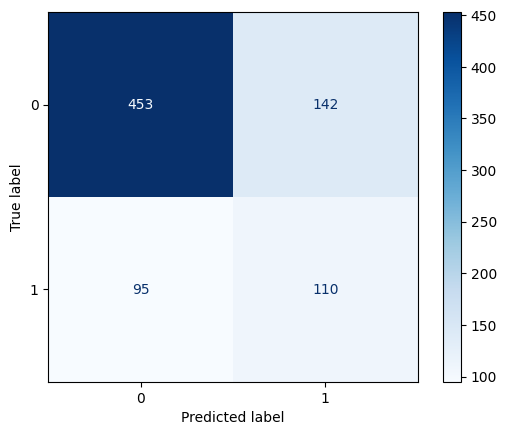

In [93]:
print("Naive Bayes")
nb = ComplementNB(alpha=0.1)
show_pipeline(nb)


In [94]:
# results = {
#     "Logistic Regression": accuracy_score(y_test, y_pred_lr),
#     "Random Forest": accuracy_score(y_test, y_pred_rf),
#     "Naive Bayes": accuracy_score(y_test, y_pred_nb),
# }

# for model, acc in results.items():
#     print(f"{model}: {acc:.4f}")


In [107]:
from sklearn.model_selection import GridSearchCV

params = {"classifier__alpha": [0.1, 0.5, 1.0, 2.0, 5.0]}

grid = GridSearchCV(
    show_pipeline(ComplementNB(), test=True), params, cv=5, scoring="f1"
)

grid.fit(X_train, y_train)
print("Best alpha:", grid.best_params_)
print("Best F1:", grid.best_score_)


Best alpha: {'classifier__alpha': 0.1}
Best F1: 0.43104965517734345


0.7625
              precision    recall  f1-score   support

       False       0.76      0.98      0.86       595
        True       0.73      0.12      0.20       205

    accuracy                           0.76       800
   macro avg       0.75      0.55      0.53       800
weighted avg       0.75      0.76      0.69       800

Best params: {'classifier__class_weight': 'balanced', 'classifier__max_depth': 10, 'classifier__max_features': 'sqrt', 'classifier__n_estimators': 200}
Best F1: 0.4572409585271388


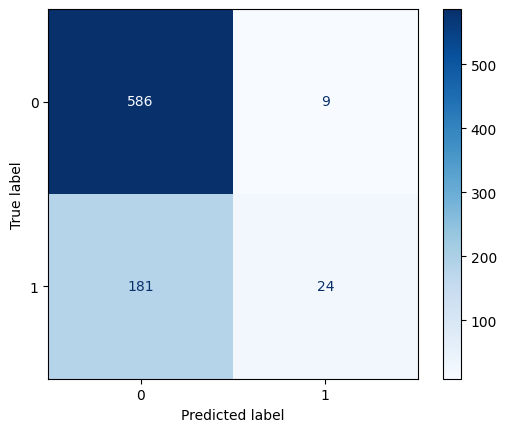

In [96]:
params = {
    "classifier__n_estimators": [100, 200, 300],
    "classifier__max_depth": [None, 10, 20],
    "classifier__max_features": ["sqrt", "log2"],
    "classifier__class_weight": ["balanced", None],
}

grid = GridSearchCV(
    show_pipeline(RandomForestClassifier(random_state=42), test=True),
    params,
    cv=5,
    scoring="f1",
    n_jobs=-1,  # use all CPU cores
)

grid.fit(X_train, y_train)
print("Best params:", grid.best_params_)
print("Best F1:", grid.best_score_)


0.765
              precision    recall  f1-score   support

       False       0.77      0.98      0.86       595
        True       0.72      0.14      0.23       205

    accuracy                           0.77       800
   macro avg       0.74      0.56      0.55       800
weighted avg       0.75      0.77      0.70       800



/home/righteousness/Documents/Codes/machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this warning, leave 'penalty' set to its default value and use 'l1_ratio' or 'C' instead. Use l1_ratio=0 instead of penalty='l2', l1_ratio=1 instead of penalty='l1', l1_ratio set to a float between 0 and 1 instead of penalty='elasticnet', and C=np.inf instead of penalty=None.
  warnings.warn(
/home/righteousness/Documents/Codes/machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1429: UserWarning: Inconsistent values: penalty=l1 with l1_ratio=0.0. penalty is deprecated. Please use l1_ratio only.
  warnings.warn(
/home/righteousness/Documents/Codes/machine_learning/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1403: FutureWarning: 'penalty' was deprecated in version 1.8 and will be removed in 1.10. To avoid this w

Best params: {'classifier__C': 1.0, 'classifier__class_weight': 'balanced', 'classifier__penalty': 'l1', 'classifier__solver': 'saga'}
Best F1: 0.5041773174678259


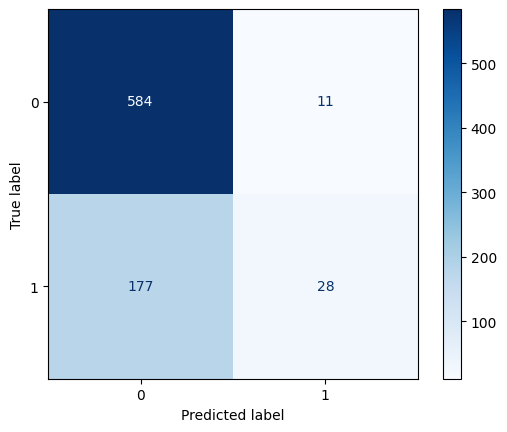

In [98]:
params = {
    "classifier__C": [0.01, 0.1, 1.0, 10, 100],
    "classifier__penalty": ["l1", "l2"],
    "classifier__solver": ["saga", "liblinear"],
    "classifier__class_weight": ["balanced", None],
}

grid = GridSearchCV(
    show_pipeline(LogisticRegression(max_iter=1000), test=True),
    params,
    cv=5,
    scoring="f1",
    n_jobs=-1,
)

grid.fit(X_train, y_train)
print("Best params:", grid.best_params_)
print("Best F1:", grid.best_score_)
